<a href="https://colab.research.google.com/github/halldm2000/NOAA-AI-2020-TUTORIAL/blob/master/taylor_series_pytorch_data_split.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Functions for generating and plotting the data**

In [11]:
import torch
import matplotlib.pyplot as plt

!mkdir -p images

def generate_data(nterms,  noise=0.2, rand_seed= 1):
  # generate a noisy taylor series

  torch.manual_seed(rand_seed) 
  x = torch.linspace(-1,1,100)                   
  y = sum(torch.randn(1)*x**(i) for i in range(nterms) ) + noise * torch.randn_like(x)
  return x,y

def plot(pred, train_loss, val_loss):
  # plot training data points and the model prediction
  epoch = len(train_loss)
  loss  = train_loss[-1]

  terms = [f'${w[i]:+.2f}x^{i}$ ' for i in range(len(w))]
  eqn   = 'y ='+ ''.join(terms)
  
  plt.figure(figsize=(8,8),dpi=1.5*72)
  
  plt.subplot(2,1,1)
  plt.plot(x_train,y_train,'.', label='training points')
  plt.plot(x_val,y_val,'.',color='g',label='validation points')
  plt.plot(x,pred, linewidth=3,label='model prediction')
  plt.title(f"epoch={epoch}, loss = {loss:.4f}\n")
  plt.ylim(y.min(),y.max())
  plt.text(0.5, 1.02, eqn, transform=plt.gca().transAxes, fontsize=8,horizontalalignment='center')
  plt.legend()

  plt.subplot(2,1,2)
  epochs = range( len(train_loss) )
  plt.semilogy(epochs, train_loss, label="training loss")
  plt.semilogy(epochs, val_loss,'g', label="validation loss")
  plt.title('loss vs time')
  plt.xlabel('epoch')
  plt.ylabel('average error')
  plt.ylim(bottom=1e-2)
  plt.legend()

  plt.savefig(f'./images/img_{epoch:03d}',bbox_inches='tight');
  plt.show()


**Fit Model to Data**

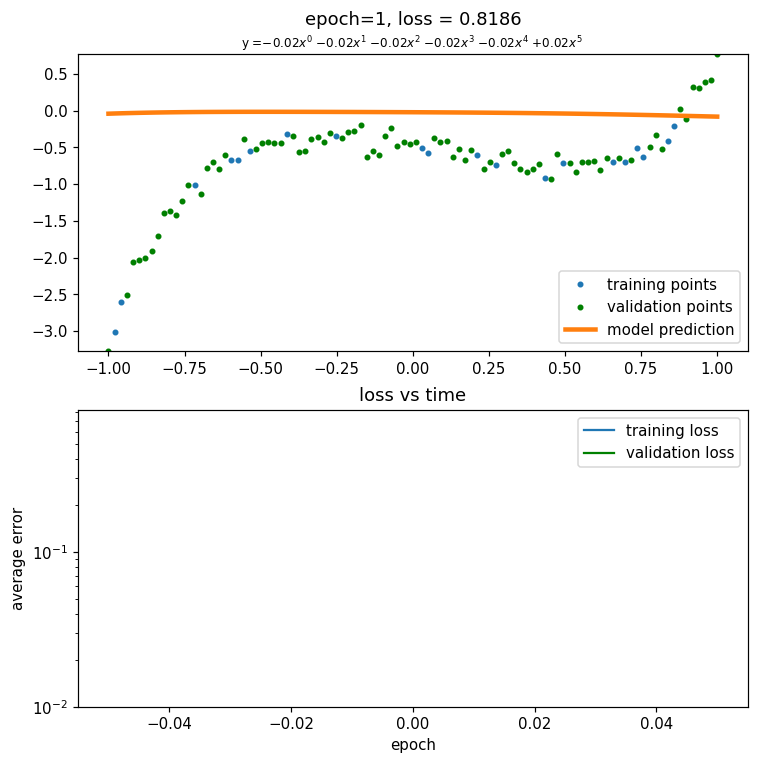

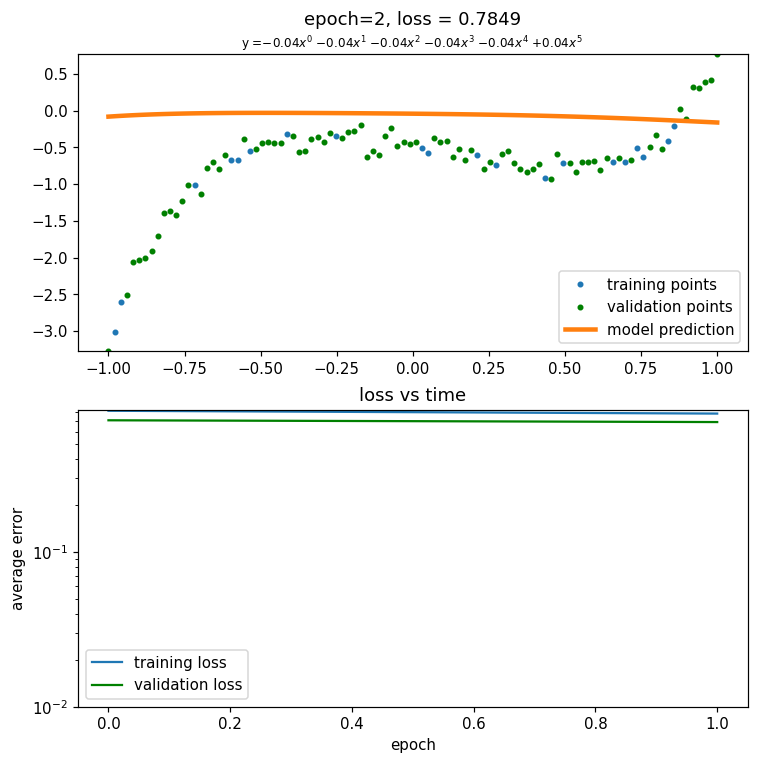

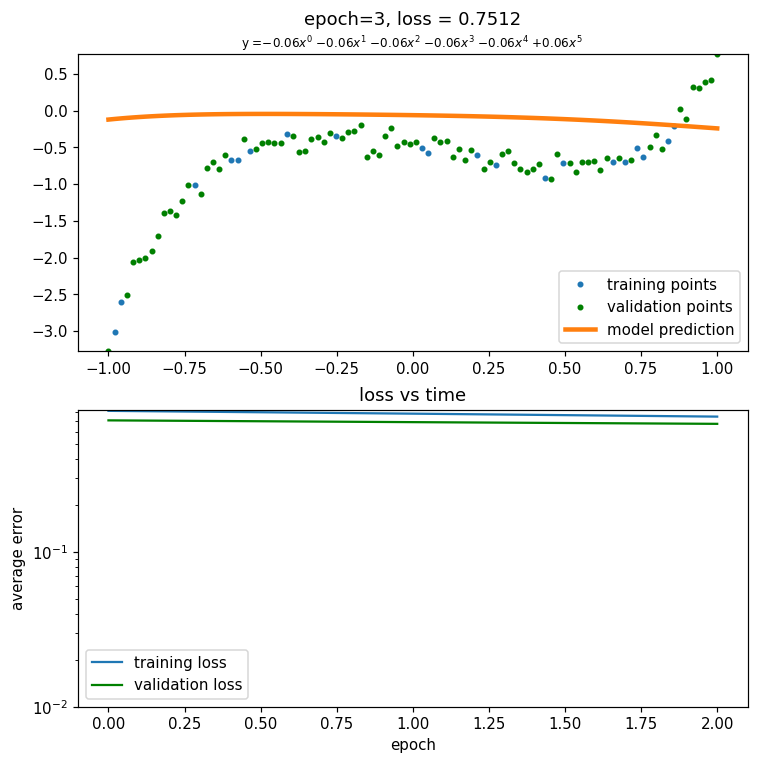

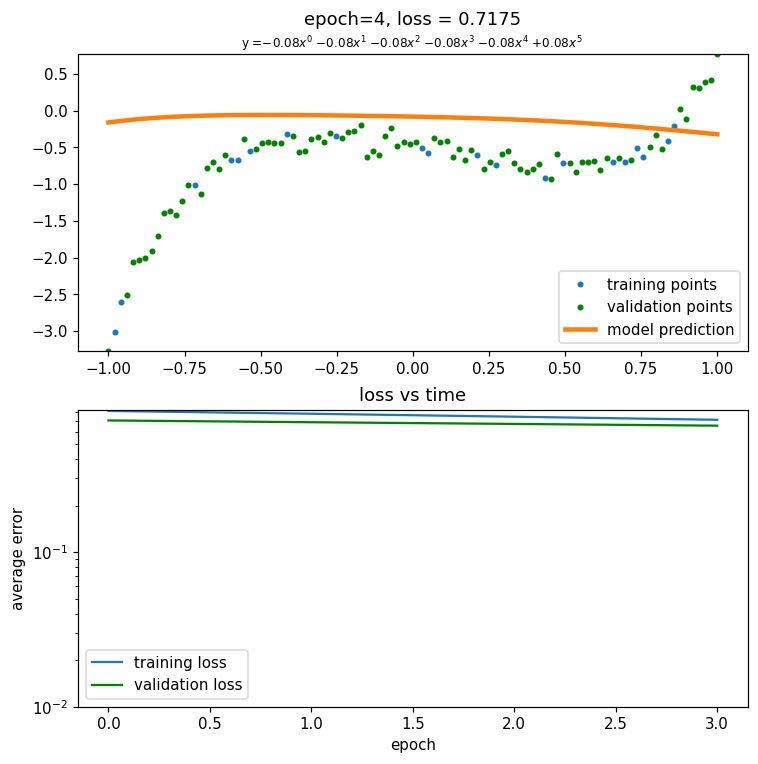

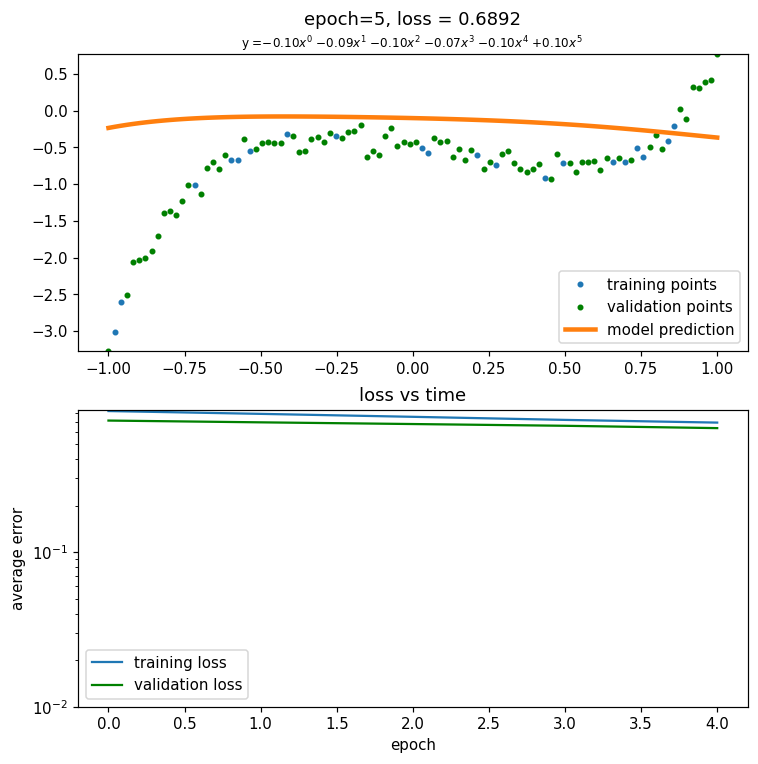

...

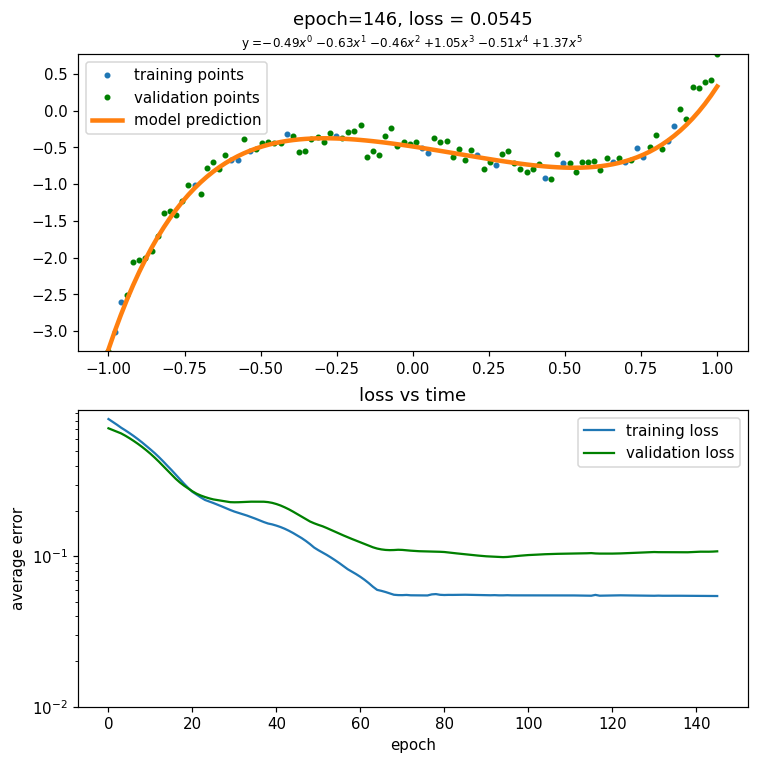

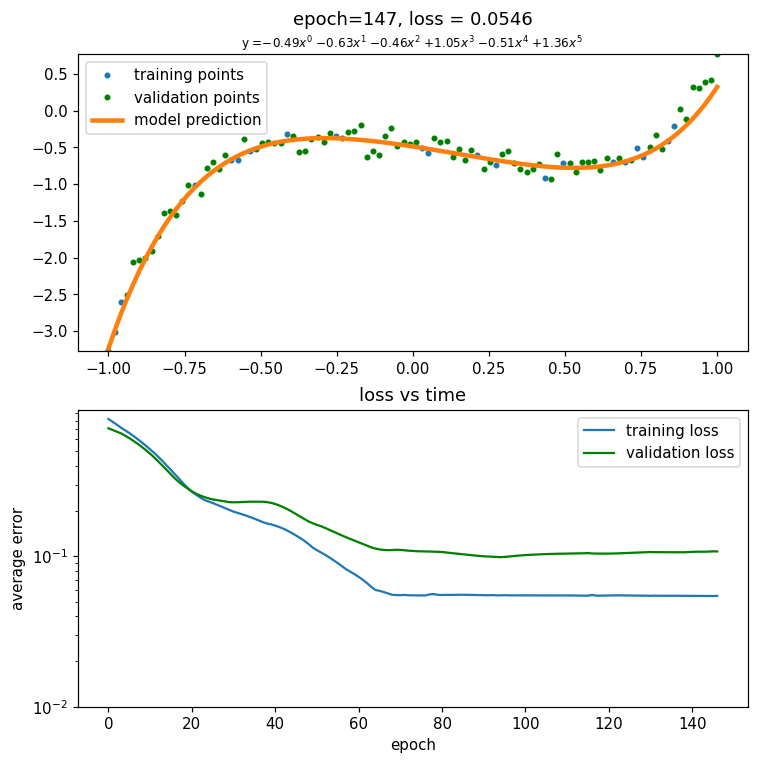

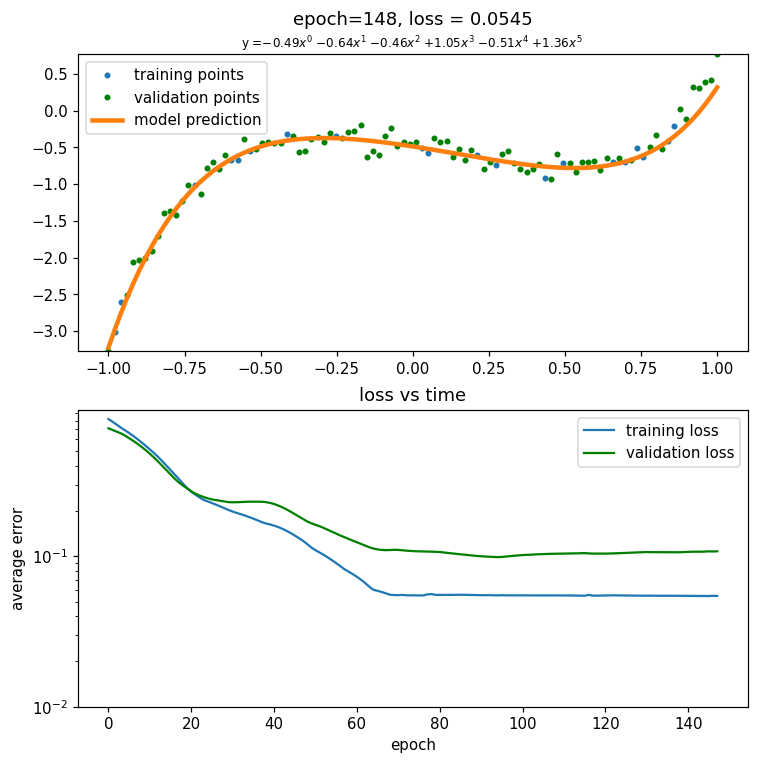

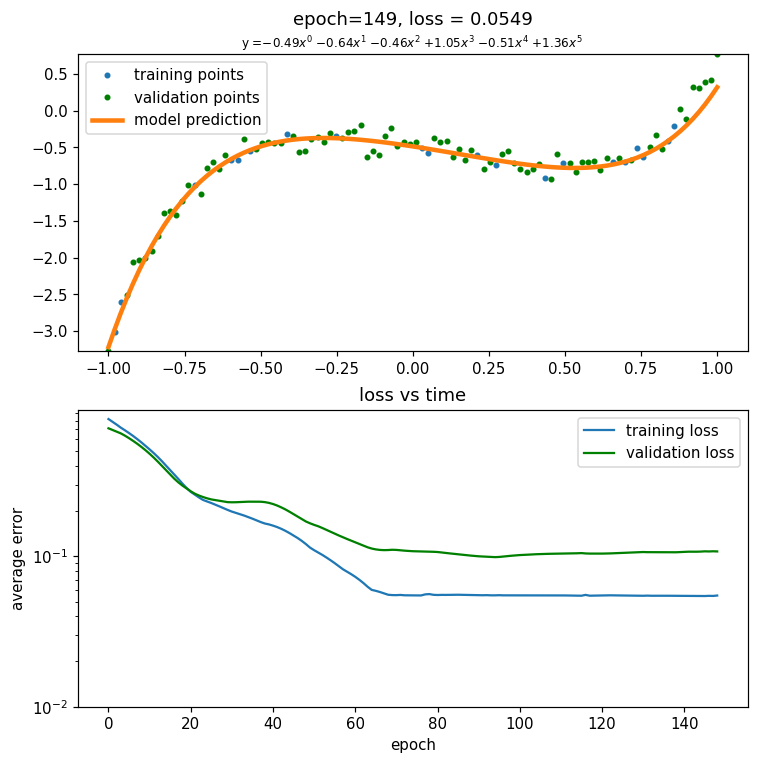

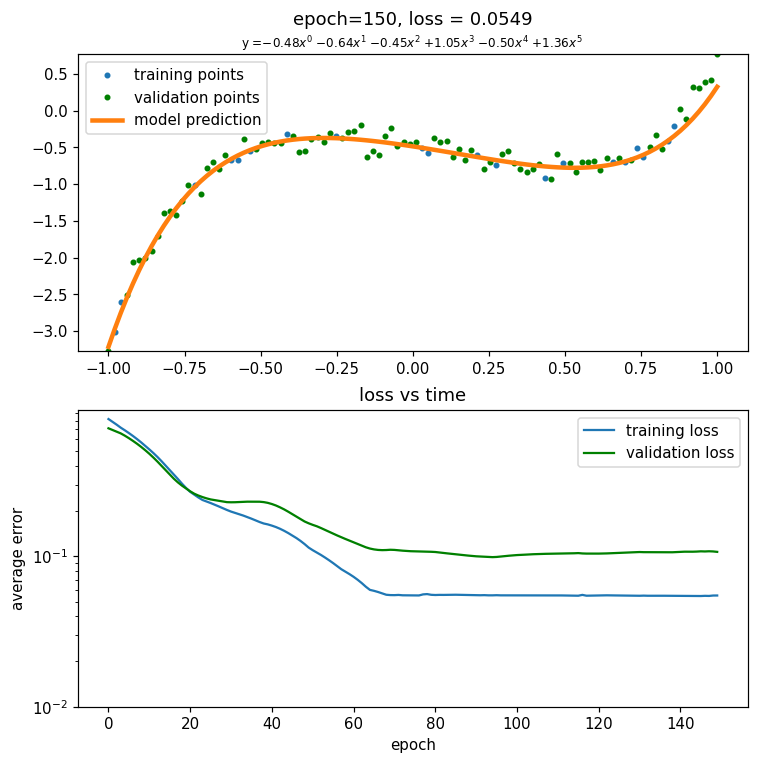

In [12]:
import torch
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# DATA
x,y = generate_data(nterms = 6, noise=0.1, rand_seed=5)
x_train, x_val, y_train, y_val = train_test_split(
    x, y, test_size=0.80, random_state=42)

# MODEL
w = torch.zeros(6, requires_grad = True)                  
def model(x): return sum(w[i]*x**i for i in range(len(w))) 

# OPTIMIZER
optimizer = torch.optim.Adam(params = [w], lr=2e-2)

train_loss, val_loss=[],[]
for epoch in range(150):

  # TRAIN
  p_train = model(x_train)
  optimizer.zero_grad()
  loss = (p_train-y_train).abs().mean()
  loss.backward()
  optimizer.step()
  train_loss.append(loss.item())

  with torch.no_grad():

    # VALIDATE
    p_val = model(x_val)
    loss_val = (p_val-y_val).abs().mean()
    val_loss.append(loss_val.item())

    # PLOT
    prediction = model(x)
    plot(prediction, train_loss, val_loss)


**Convert figures into a movie**

In [13]:
!ffmpeg -loglevel warning -i ./images/img_%03d.png -vf scale=1280:-2 -pix_fmt yuv420p -y out.mp4

**Embed the movie in the notebook**

In [14]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=800 controls><source src="%s" type="video/mp4"></video>
""" % data_url)

In [ ]:
!rm ./images/img_*.png